In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

from importlib import reload

import numpy as np
import pandas as pd

from brainspace.plotting import surface_plotting as splot
from brainspace.mesh import mesh_operations as mop, mesh_io as mio, array_operations as aop
from brainspace.utils.parcellation import map_to_mask, map_to_labels

from VTKUtils import highlevel_io as hio
from brainspace.mesh import mesh_creation
import nibabel as nib
from brainstat.datasets import fetch_mask, fetch_template_surface
from brainstat.tutorial.utils import fetch_mics_data
from brainspace.mesh import mesh_io as mio
from brainspace.mesh import mesh_operations as mop
from brainspace.vtk_interface import serial_connect, wrap_vtk
from vtk import vtkPolyDataNormals
from brainspace.plotting import plot_hemispheres
import scipy.io
import IPython
import SimpleITK as sitk
import statsmodels.api as sms
import statsmodels.formula.api as smf

import itertools
from collections import defaultdict

from scipy.io import loadmat

from brainspace.vtk_interface import wrap_vtk, serial_connect
from nibabel.freesurfer import read_morph_data
import vtk

from brainspace.plotting import surface_plotting as splot
from brainspace.mesh import mesh_operations as mop, mesh_io as mio, array_operations as aop
from brainspace.utils.parcellation import map_to_mask, map_to_labels

/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/nilearn/datasets/__init__.py:96: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [2]:
list = np.concatenate([np.arange(5,17),np.arange(20,40)])
list1 = [1,2,1,2,1,2,1,2,1,2,1,2,4,3,6,5,2,1,2,1,2,1,2,1,8,7,8,7,10,9,12,11]

fetL = scipy.io.loadmat('/Users/andrea/Desktop/analysis/fet/lh_params.mat')
neoL = scipy.io.loadmat('/Users/andrea/Desktop/analysis/neo/lh_params.mat')
fetR = scipy.io.loadmat('/Users/andrea/Desktop/analysis/fet/rh_params.mat')
neoR = scipy.io.loadmat('/Users/andrea/Desktop/analysis/neo/rh_params.mat')

fet_curv = np.concatenate([fetL['curv'], fetR['curv']])
neo_curv = np.concatenate([neoL['curv'], neoR['curv']])

fet_sulc = np.concatenate([fetL['sulc'], fetR['sulc']])
neo_sulc = np.concatenate([neoL['sulc'], neoR['sulc']])

fet_lgi = np.concatenate([fetL['lgi'], fetR['lgi']])
neo_lgi = np.concatenate([neoL['lgi'], neoR['lgi']])

fet_thick = np.concatenate([fetL['thick'], fetR['thick']])
neo_thick = np.concatenate([neoL['thick'], neoR['thick']])

curvature = np.concatenate([fet_curv.T, neo_curv.T])
sulcalDepth = np.concatenate([fet_sulc.T, neo_sulc.T])
lgi = np.concatenate([fet_lgi.T, neo_lgi.T])
thickness = np.concatenate([fet_thick.T, neo_thick.T])

df = pd.read_excel('/Users/andrea/Desktop/analysis/demographics1.xlsx')

lobes_list = ['TempLobeL','TempLobeR','InsulaL','InsulaR','ParietalL','ParietalR','CingulateL','CingulateR','FrontalL','FrontalR','OccipitalL','OccipitalR']

for n,i in enumerate(lobes_list):
    X = df[['Age']]
    X.Age = X.Age**2#**(-1/3)
    y = df[i]
    model = sms.OLS(y, X).fit()
    model.summary()
    X1 = df[0:1][['Age']]
    X1.Age = np.mean(X.Age)
    r = y - np.array(model.predict(X))
    df[i] = np.array(model.predict(X1)) + np.array(r)

avg_df = df.groupby(['Group','Diagnosis'], as_index=False)[lobes_list].mean()

d = avg_df[lobes_list].to_numpy()

delta_fet = (d[1,:] - d[0,:]) / d[0,:] * 100
delta_neo = (d[3,:] - d[2,:]) / d[2,:] * 100

/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

In [3]:
surf = dict()
features = defaultdict(dict)

# Load surfaces, labels and compute normals
for k1, k2 in itertools.product(['fet', 'neo'], ['lh', 'rh']):
    # Load syrface and compute normals
    s = mio.read_surface(f'/Users/andrea/Desktop/analysis/{k1}/{k2}.avg_pial', itype='fs')
    normals_filter = wrap_vtk(vtk.vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
               computeCellNormals=True, nonManifoldTraversal=False)
    s = serial_connect(s, normals_filter)
    
    # Load labels and add to surface
    labels_plot = read_morph_data(f'/Users/andrea/Desktop/analysis/{k1}/{k2}.avg_labels').astype(float)
    labels = labels_plot.astype(int)
    s.append_array(labels, name='avg_labels', at='point')
    labels_plot[labels == 0] = np.nan # Set medial wall to nan (useful for assigning a different color to nan - see plot_hemispheres nan_color)
    s.append_array(labels_plot, name='labels_plot', at='point')
    
    mask = labels==0

    clusters = (mask[mask]).astype(float)
    clusters = map_to_mask(clusters, mask, fill=np.nan)
    s.append_array(clusters, name='mask', at='point')
    clusters_cc = mop.get_connected_components(s, labeling='mask') # Get connected components
    mask_clusters_to_remove = np.unique(clusters_cc, return_counts=True)[1] <= 100 # All those clusters with 50 or less vertices (50 here is too much and only used for this example)
    clusters2 = clusters.copy()
    clusters2[np.isin(clusters_cc, np.where(mask_clusters_to_remove)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    s.append_array(clusters2, name='mask_update', at='point')
    
    mask = s.PointData['mask_update']
    
    # compute label boundaries - Important! set non-boundary vertices to nan
    bundary = aop.get_labeling_border(s, 'avg_labels').astype(float)    
    bundary[bundary == 0] = np.nan  
    s.append_array(bundary, name='boundary')
    
    joint_key = f'{k1}_{k2}'  # eg fetal_lh
    
    # Load features
    data = loadmat(f'/Users/andrea/Desktop/analysis/{k1}/{k2}_params.mat')
    
    features[joint_key]['labels'] = data['labels'].T
    
    # Add features for 10 subjects - for testing
    for it in range(30):
        feat = features[joint_key]['labels'][it].copy()
        #feat[labels == 0] = np.nan
        s.append_array(feat, name='labels' + f'_subject{it}', at='point')
    
    for kfeat in ['curv', 'lgi', 'sulc', 'thick']:
        features[joint_key][kfeat] = data[kfeat].T
    
        # Add features for 10 subjects - for testing
        for it in range(30):
            feat = features[joint_key][kfeat][it].copy()
            feat[s.PointData['labels' + f'_subject{it}'] == 0] = 0
            s.append_array(feat, name=kfeat + f'_subject{it}', at='point')

        # Add average features to surfaces
        avg = features[joint_key][kfeat].mean(0)
        avg[labels == 0] = np.nan
        s.append_array(avg, name=kfeat, at='point')
        
    
    surf[joint_key] = s

In [4]:
for k1, k2 in itertools.product(['fet', 'neo'], ['lh', 'rh']): #
    a = defaultdict(dict)
    b = defaultdict(dict)
    
    joint_k = f'{k1}_{k2}'
    
    for it in range(30):
        s = surf[joint_k]
        for par in ['curv','lgi','sulc','thick']:
            aop.smooth_array(s, par + '_subject' + str(it), n_iter=60, kernel='gaussian', relax=.3, append=True, key=par + '_subject' + str(it) + '_smoothed')
            aop.smooth_array(s, par + '_subject' + str(it), n_iter=150, kernel='gaussian', relax=.8, append=True, key=par + '_subject' + str(it) + '_smoothed_aggressive')

Fet


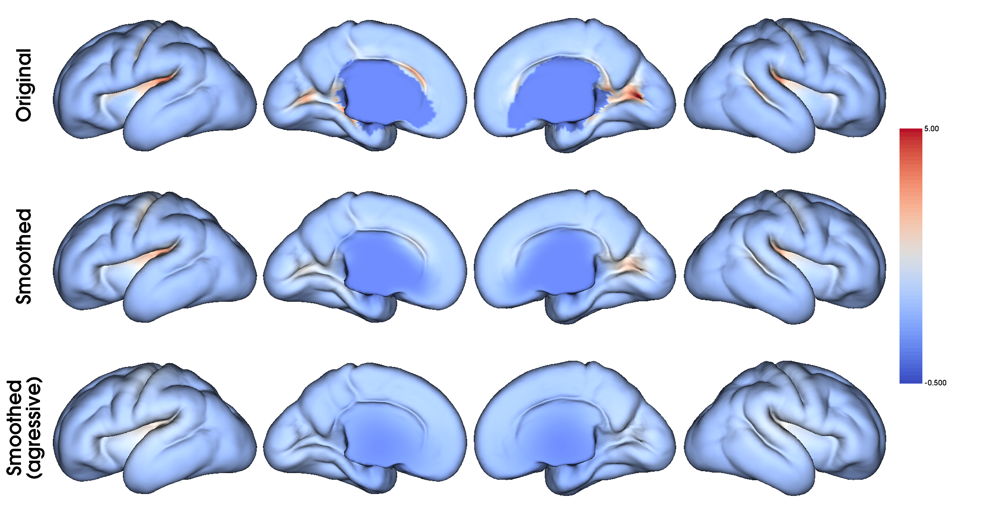





Neo


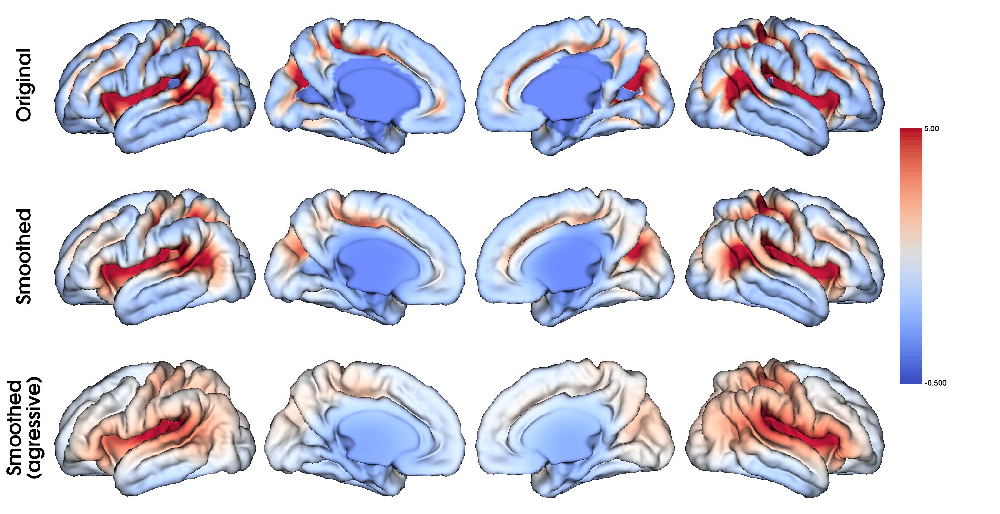

In [5]:
it = 0
for k in ['fet', 'neo']:
    p = splot.plot_hemispheres(surf[f'{k}_lh'], surf[f'{k}_rh'], 
                           interactive=False, embed_nb=True, scale=3, zoom=1.5, 
                           size=(700, 3*120), 
                           array_name=['lgi_subject' + str(it), 'lgi_subject'  + str(it) + '_smoothed', 'lgi_subject'  + str(it) + '_smoothed_aggressive'],
                           cmap='coolwarm',
                           nan_color = (0, 0, 0, 1), # Make medial wall color to black
                           label_text=['Original', 'Smoothed', 'Smoothed\n(agressive)'],
                           color_bar=True, share=True, color_range = (-.5, 5)
                          )
    
    print(k.capitalize())
    display(p)
    print('\n\n\n')

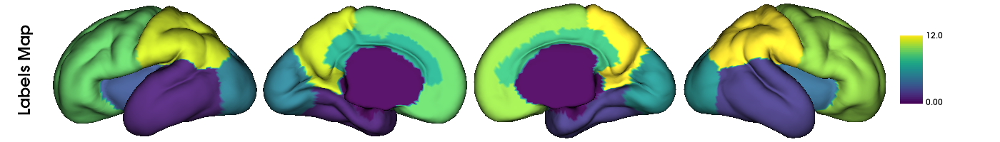

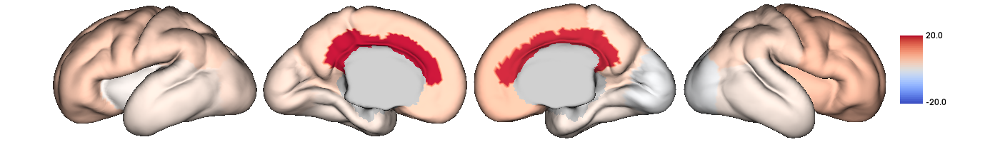

In [6]:
# Load behavioral markers
pial_left = nib.freesurfer.io.read_geometry("/Users/andrea/Desktop/analysis/fet/lh.avg_pial")
pial_right = nib.freesurfer.io.read_geometry("/Users/andrea/Desktop/analysis/fet/rh.avg_pial")
pial_left = mesh_creation.build_polydata(pial_left[0],pial_left[1])
pial_right = mesh_creation.build_polydata(pial_right[0],pial_right[1])

# It can read vtk, vtp, and even freesurfer. For freesurfer files you have to add the itype='fs' or itype='asc' check docs: mio.read_surface?
# x = mio.read_surface('/path/to/freesurfer/file', itype='fs') 
lh_fet = mio.read_surface('/Users/andrea/Desktop/analysis/fet/lh.avg_pial', itype='fs') # /path/to/left/hemisphere
rh_fet = mio.read_surface('/Users/andrea/Desktop/analysis/fet/rh.avg_pial', itype='fs') # /path/to/right/hemisphere
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
lh_normals_fet = serial_connect(lh_fet, normalsFilter)
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
rh_normals_fet = serial_connect(rh_fet, normalsFilter)

pial_combined_fet = mop.combine_surfaces(lh_fet, rh_fet)

left_labels = nib.freesurfer.io.read_morph_data("/Users/andrea/Desktop/analysis/fet/lh.avg_labels")
right_labels = nib.freesurfer.io.read_morph_data("/Users/andrea/Desktop/analysis/fet/rh.avg_labels")
labels = np.concatenate([left_labels, right_labels])
mask = np.zeros((labels.shape), dtype=bool)
mask[labels==0] = 0
mask[labels!=0] = 1

mask_fet = np.concatenate([np.array(surf['fet_lh'].get_array('mask_update')), np.array(surf['fet_rh'].get_array('mask_update'))])==0

deltas = delta_fet.T

for l in range(np.size(labels)):
    for i,n in enumerate(list):
        if labels[l] == n:
            labels[l] = list1[i]

deltas_proj_fet= np.zeros(labels.shape)
for i in range(len(labels)):
    for j in range(len(deltas)):
        if labels[i]==j+1:
            deltas_proj_fet[i] = deltas[j]
            
deltas_proj_fet[~mask_fet]=np.nan

def local_plot_hemispheres(values, label_text, color_range, cmap="viridis"):
    # Plot cortical surfaces with values as the data, label_text as
    # the labels, and color_range as the limits of the color bar.
    return plot_hemispheres(
        lh_normals_fet,
        rh_normals_fet,
        values,
        color_bar=True,
        color_range=color_range,
        label_text=label_text,
        cmap=cmap,
        embed_nb=True,
        size=(1400, 200),
        zoom=1.8,
        nan_color=(0.7, 0.7, 0.7, 1),
        cb__labelTextProperty={"fontSize": 12},
        interactive=False,
    )


p = local_plot_hemispheres(labels, ["Labels Map"], (np.min(labels), np.max(labels)))
display(p)
p = local_plot_hemispheres(deltas_proj_fet, [""], (-20, 20), cmap="coolwarm")
display(p)

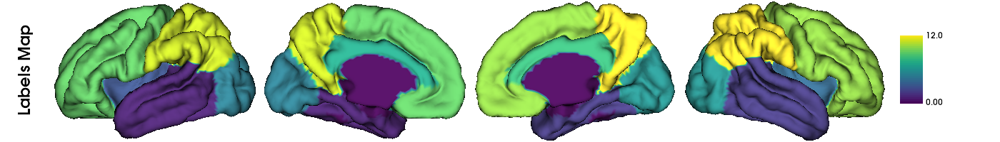

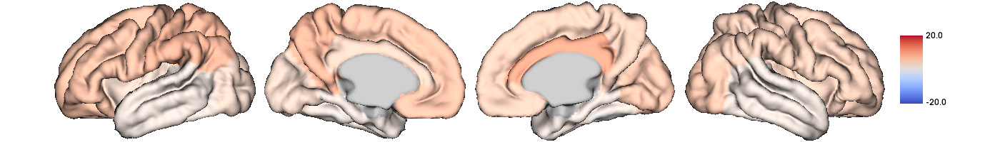

In [7]:
# Load behavioral markers
pial_left = nib.freesurfer.io.read_geometry("/Users/andrea/Desktop/analysis/neo/lh.avg_pial")
pial_right = nib.freesurfer.io.read_geometry("/Users/andrea/Desktop/analysis/neo/rh.avg_pial")
pial_left = mesh_creation.build_polydata(pial_left[0],pial_left[1])
pial_right = mesh_creation.build_polydata(pial_right[0],pial_right[1])

# It can read vtk, vtp, and even freesurfer. For freesurfer files you have to add the itype='fs' or itype='asc' check docs: mio.read_surface?
# x = mio.read_surface('/path/to/freesurfer/file', itype='fs') 
lh_neo = mio.read_surface('/Users/andrea/Desktop/analysis/neo/lh.avg_pial', itype='fs') # /path/to/left/hemisphere
rh_neo = mio.read_surface('/Users/andrea/Desktop/analysis/neo/rh.avg_pial', itype='fs') # /path/to/right/hemisphere
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
lh_normals_neo = serial_connect(lh_neo, normalsFilter)
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
rh_normals_neo = serial_connect(rh_neo, normalsFilter)

pial_combined_neo = mop.combine_surfaces(lh_neo, rh_neo)

left_labels = nib.freesurfer.io.read_morph_data("/Users/andrea/Desktop/analysis/neo/lh.avg_labels")
right_labels = nib.freesurfer.io.read_morph_data("/Users/andrea/Desktop/analysis/neo/rh.avg_labels")
labels = np.concatenate([left_labels, right_labels])
mask = np.zeros((labels.shape), dtype=bool)
mask[labels==0] = 0
mask[labels!=0] = 1

mask_neo = np.concatenate([np.array(surf['neo_lh'].get_array('mask_update')), np.array(surf['neo_rh'].get_array('mask_update'))])==0

deltas = delta_neo.T

for l in range(np.size(labels)):
    for i,n in enumerate(list):
        if labels[l] == n:
            labels[l] = list1[i]

deltas_proj_neo = np.zeros(labels.shape)
for i in range(len(labels)):
    for j in range(len(deltas)):
        if labels[i]==j+1:
            deltas_proj_neo[i] = deltas[j]
            
deltas_proj_neo[~mask_neo]=np.nan

def local_plot_hemispheres(values, label_text, color_range, cmap="viridis"):
    # Plot cortical surfaces with values as the data, label_text as
    # the labels, and color_range as the limits of the color bar.
    return plot_hemispheres(
        lh_normals_neo,
        rh_normals_neo,
        values,
        color_bar=True,
        color_range=color_range,
        label_text=label_text,
        cmap=cmap,
        embed_nb=True,
        size=(1400, 200),
        zoom=1.8,
        nan_color=(0.7, 0.7, 0.7, 1),
        cb__labelTextProperty={"fontSize": 12},
        interactive=False,
    )


p = local_plot_hemispheres(labels, ["Labels Map"], (np.min(labels), np.max(labels)))
display(p)
p = local_plot_hemispheres(deltas_proj_neo, [""], (-20, 20), cmap="coolwarm")
display(p)

/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/statsmodels/regression/mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/statsmodels/regression/mix

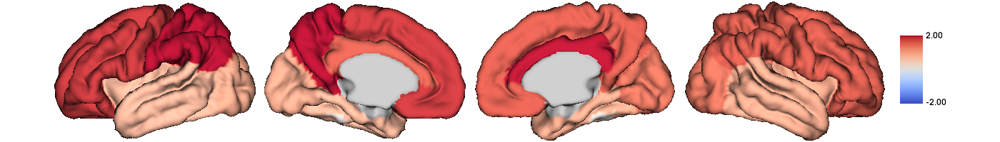

In [8]:
df = pd.read_excel('/Users/andrea/Desktop/analysis/demographics1.xlsx')
df['CV'] = df[['TempLobeL', 'TempLobeR',
       'InsulaL', 'InsulaR', 'ParietalL', 'ParietalR', 'CingulateL',
       'CingulateR', 'FrontalL', 'FrontalR', 'OccipitalL', 'OccipitalR']].sum(1)
lobes_list = ['TempLobeL','TempLobeR','InsulaL','InsulaR','ParietalL','ParietalR','CingulateL','CingulateR','FrontalL','FrontalR','OccipitalL','OccipitalR']
pval = np.zeros(len(lobes_list))
for n,i in enumerate(lobes_list):
    # Run LMER
    md = smf.mixedlm( str(i) + " ~ Age + Sex + Diagnosis", df, groups=df["ID"])
    mdf = md.fit()
    pval[n] = mdf.tvalues['Diagnosis[T.VM]']
    
pvals_proj= np.zeros(labels.shape)
for i in range(len(labels)):
    for j in range(len(pval)):
        if labels[i]==j+1:
            pvals_proj[i] = pval[j]
            
pvals_proj[~mask_neo]=np.nan
            
import numpy as np
from brainspace.plotting import plot_hemispheres

def local_plot_hemispheres(values, label_text, color_range, cmap="coolwarm"):
    # Plot cortical surfaces with values as the data, label_text as
    # the labels, and color_range as the limits of the color bar.
    return plot_hemispheres(
        lh_normals_neo,
        rh_normals_neo,
        values,
        color_bar=True,
        color_range=color_range,
        label_text=label_text,
        cmap=cmap,
        embed_nb=True,
        size=(1400, 200),
        zoom=1.8,
        nan_color=(0.7, 0.7, 0.7, 1),
        cb__labelTextProperty={"fontSize": 12},
        interactive=False,
    )

local_plot_hemispheres(pvals_proj, [""], (-2, 2))

## Load surafces for smoothing and removal of small clusters

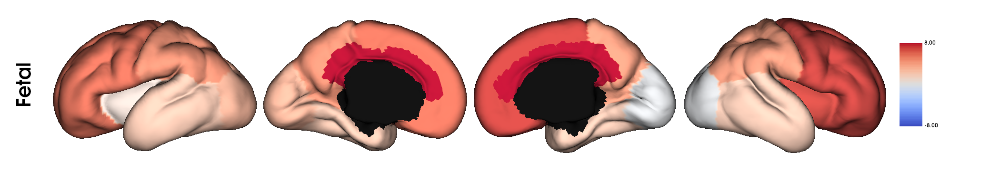

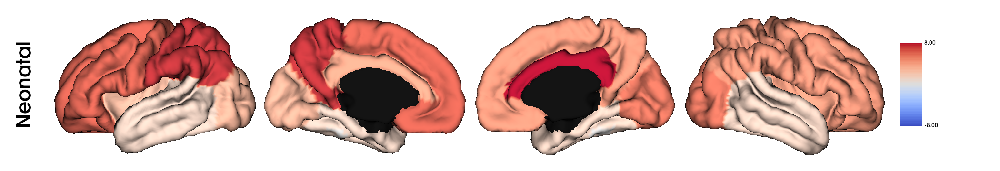

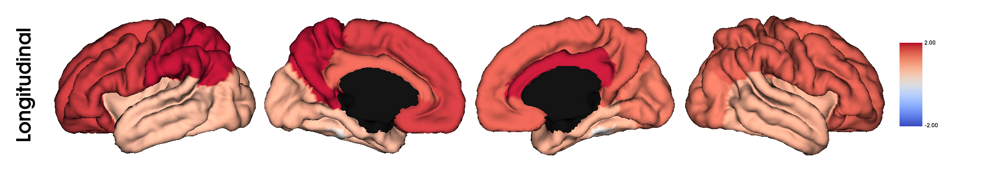

In [9]:
p = splot.plot_hemispheres(lh_normals_fet, rh_normals_fet, 
                           interactive=False, embed_nb=True, scale=3, zoom=1.5, 
                           size=(700, 120), 
                           array_name=[deltas_proj_fet],
                           cmap='coolwarm',
                           nan_color = (0, 0, 0, 1), # Make medial wall color to black
                           label_text=['Fetal'],
                           color_bar=True, color_range = (-8, 8)
                          )
display(p)
p = splot.plot_hemispheres(lh_normals_neo, rh_normals_neo, 
                           interactive=False, embed_nb=True, scale=3, zoom=1.5, 
                           size=(700, 120), 
                           array_name=[deltas_proj_neo],
                           cmap='coolwarm',
                           nan_color = (0, 0, 0, 1), # Make medial wall color to black
                           label_text=['Neonatal'],
                           color_bar=True, color_range = (-8, 8)
                          )
display(p)
p = splot.plot_hemispheres(lh_normals_neo, rh_normals_neo, 
                           interactive=False, embed_nb=True, scale=3, zoom=1.5, 
                           size=(700, 120), 
                           array_name=[pvals_proj],
                           cmap='coolwarm',
                           nan_color = (0, 0, 0, 1), # Make medial wall color to black
                           label_text=['Longitudinal'],
                           color_bar=True, color_range = (-2.0, 2.0)
                          )
display(p)

In [10]:
def plot_slm_results(slm, value, plot_peak=False, plot_fdr=False):
    
    handles = [local_plot_hemispheres(slm.t, ["t-values"], (-4, 4), "RdBu_r")]

    plot_pvalues = [np.copy(slm.P["pval"]["C"])]
    labels = ["Cluster p-values"]

    if plot_peak:
        plot_pvalues.append(np.copy(slm.P["pval"]["P"]))
        labels.append("Peak p-values")

    if plot_fdr:
        plot_pvalues.append(np.copy(slm.Q))
        labels.append("Vertex p-values")

    [np.place(x, np.logical_or(x > 0.05, ~mask), np.nan) for x in plot_pvalues]

    for i in range(len(plot_pvalues)):
        handles.append(
            local_plot_hemispheres(plot_pvalues[i], [labels[i]], (0, 0.05), "RdBu_r")
        )

    return handles[value]

In [11]:
fetLs = defaultdict(dict)
fetRs = defaultdict(dict)
neoLs = defaultdict(dict)
neoRs = defaultdict(dict)
fls = np.zeros((fetL['curv'].shape))
frs = np.zeros((fetL['curv'].shape))
nls = np.zeros((fetL['curv'].shape))
nrs = np.zeros((fetL['curv'].shape))

for i in range(30):
    for par in ['curv','sulc']:
        fetLs[par][i] = np.array(surf['fet_lh'].get_array(par + '_subject' + str(i) + '_smoothed_aggressive'))
        fetRs[par][i] = np.array(surf['fet_rh'].get_array(par + '_subject' + str(i) + '_smoothed_aggressive'))
        neoLs[par][i] = np.array(surf['neo_lh'].get_array(par + '_subject' + str(i) + '_smoothed_aggressive'))
        neoRs[par][i] = np.array(surf['neo_rh'].get_array(par + '_subject' + str(i) + '_smoothed_aggressive'))
    for par in ['thick','lgi']:
        fetLs[par][i] = np.array(surf['fet_lh'].get_array(par + '_subject' + str(i) + '_smoothed'))
        fetRs[par][i] = np.array(surf['fet_rh'].get_array(par + '_subject' + str(i) + '_smoothed'))
        neoLs[par][i] = np.array(surf['neo_lh'].get_array(par + '_subject' + str(i) + '_smoothed'))
        neoRs[par][i] = np.array(surf['neo_rh'].get_array(par + '_subject' + str(i) + '_smoothed'))
        
for par in ['curv','lgi','sulc','thick']: #,'lgi','sulc','thick'
    for i in range(30):
        fls[:,i] = fetLs[par][i]
        frs[:,i] = fetRs[par][i]
        nls[:,i] = neoLs[par][i]
        nrs[:,i] = neoRs[par][i]
    if par=='curv':
        fet_curv = np.concatenate([fls, frs])
        neo_curv = np.concatenate([nls, nrs])
    if par=='lgi':
        fet_lgi = np.concatenate([fls, frs])
        neo_lgi = np.concatenate([nls, nrs])
    if par=='sulc':
        fet_sulc = np.concatenate([fls, frs])
        neo_sulc = np.concatenate([nls, nrs])
    if par=='thick':
        fet_thick = np.concatenate([fls, frs])
        neo_thick = np.concatenate([nls, nrs])
        
curvature = np.concatenate([fet_curv.T, neo_curv.T])
sulcalDepth = np.concatenate([fet_sulc.T, neo_sulc.T])
lgi = np.concatenate([fet_lgi.T, neo_lgi.T])
thickness = np.concatenate([fet_thick.T, neo_thick.T])

mask1 = np.concatenate([np.array(surf['neo_lh'].get_array('mask_update')), np.array(surf['neo_rh'].get_array('mask_update'))])==0

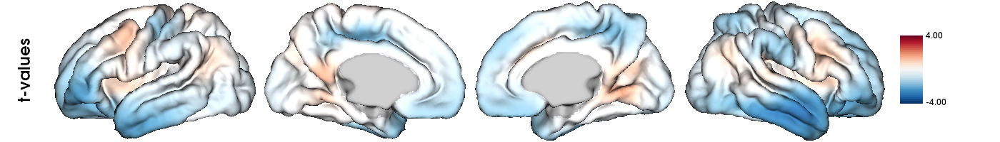

In [12]:
#df = pd.read_excel('/Users/andrea/Desktop/analysis/demographics1.xlsx')

from brainstat.stats.SLM import SLM
from brainstat.stats.terms import FixedEffect
from brainstat.stats.terms import MixedEffect

term_age = FixedEffect(df.Age)
term_sex = FixedEffect(df.Sex)
term_diag = FixedEffect(df.Diagnosis)
term_STV = FixedEffect(df.CV)
term_VV = FixedEffect(df.VV)
term_subject = MixedEffect(df.ID)

contrast_VV = df.VV
contrast_diag = ((df.Diagnosis == 'VM').astype(int) - (df.Diagnosis == 'Control').astype(int))

model_mixed = term_age**2 + term_sex + term_diag + term_VV*term_age + term_subject

slm_mixed_curv = SLM(
    model_mixed,
    contrast_diag,
    surf=pial_combined_neo,
    mask=mask1,
    correction=["rft"],
    cluster_threshold=0.05,
)
slm_mixed_curv.fit(abs(curvature))

for i in range(30):
    neoLs = np.array(surf['neo_lh'].get_array('labels_subject' + str(i)))
    neoRs = np.array(surf['neo_rh'].get_array('labels_subject' + str(i)))
        
    labels = np.concatenate([neoLs, neoRs])
    slm_mixed_curv.t.T[:,0][labels==0] = 0

slm_mixed_curv.t = aop.smooth_array(pial_combined_neo,slm_mixed_curv.t[0,:], n_iter=25, kernel='gaussian', relax=.5, append=False, key=None)           
slm_mixed_curv.t.T[~mask1] = np.nan

plot_slm_results(slm_mixed_curv, 0)

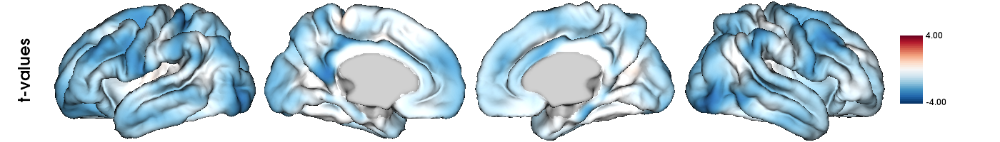

In [13]:
term_age = FixedEffect(df.Age)
term_sex = FixedEffect(df.Sex)
term_diag = FixedEffect(df.Diagnosis)
term_STV = FixedEffect(df.CV)
term_VV = FixedEffect(df.VV)
term_subject = MixedEffect(df.ID)

contrast_diag = ((df.Diagnosis == 'VM').astype(int) - (df.Diagnosis == 'Control').astype(int))

model_mixed = term_age + term_sex + term_diag + term_VV*term_age + term_subject

slm_mixed_lgi = SLM(
    model_mixed,
    contrast_diag,
    mask=mask1,
    surf=pial_combined_neo,
    correction=["rft"],
    cluster_threshold=0.05,
)
slm_mixed_lgi.fit(-lgi)

for i in range(30):
    neoLs = np.array(surf['neo_lh'].get_array('labels_subject' + str(i)))
    neoRs = np.array(surf['neo_rh'].get_array('labels_subject' + str(i)))
        
    labels = np.concatenate([neoLs, neoRs])
    slm_mixed_lgi.t.T[:,0][labels==0] = 0

slm_mixed_lgi.t = aop.smooth_array(pial_combined_neo,slm_mixed_lgi.t[0,:], n_iter=7, kernel='gaussian', relax=.5, append=False, key=None)           
slm_mixed_lgi.t.T[~mask1] = np.nan

plot_slm_results(slm_mixed_lgi, 0)

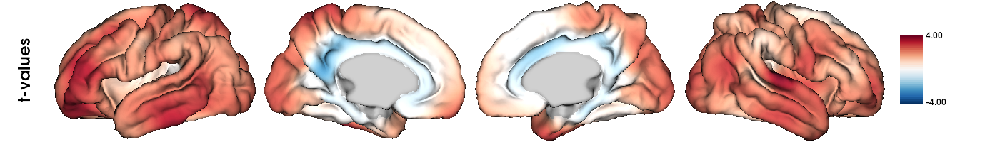

In [14]:
term_age = FixedEffect(df.Age)
term_sex = FixedEffect(df.Sex)
term_diag = FixedEffect(df.Diagnosis)
term_STV = FixedEffect(df.CV)
term_VV = FixedEffect(df.VV)
term_subject = MixedEffect(df.ID)

contrast_diag = ((df.Diagnosis == 'VM').astype(int) - (df.Diagnosis == 'Control').astype(int))
contrast_VV = df.VV

model_mixed = term_age + term_sex + term_diag + term_VV*term_age + term_subject

slm_mixed_thickness = SLM(
    model_mixed,
    contrast_diag,
    surf=pial_combined_neo,
    mask=mask1,
    correction=["rft"],
    cluster_threshold=0.05,
)
slm_mixed_thickness.fit(-thickness)

for i in range(30):
    neoLs = np.array(surf['neo_lh'].get_array('labels_subject' + str(i)))
    neoRs = np.array(surf['neo_rh'].get_array('labels_subject' + str(i)))
        
    labels = np.concatenate([neoLs, neoRs])
    slm_mixed_thickness.t.T[:,0][labels==0] = 0

slm_mixed_thickness.t = aop.smooth_array(pial_combined_neo,slm_mixed_thickness.t[0,:], n_iter=25, kernel='gaussian', relax=.5, append=False, key=None)           
slm_mixed_thickness.t.T[~mask1] = np.nan
plot_slm_results(slm_mixed_thickness, 0)

plot_slm_results(slm_mixed_thickness, 0)

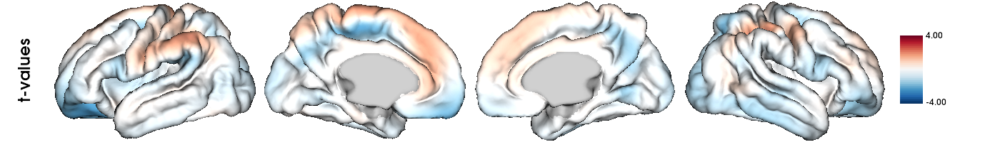

In [15]:
term_age = FixedEffect(df.Age)
term_sex = FixedEffect(df.Sex)
term_diag = FixedEffect(df.Diagnosis)
term_STV = FixedEffect(df.STV)
term_VV = FixedEffect(df.VV)
term_subject = MixedEffect(df.ID)

contrast_diag = ((df.Diagnosis == 'VM').astype(int) - (df.Diagnosis == 'Control').astype(int))
contrast_VV = df.VV*contrast_diag

model_mixed = term_age**2 + term_sex + term_diag + term_age*term_VV + term_subject

slm_mixed_sulc = SLM(
    model_mixed,
    contrast_diag,
    surf=pial_combined_neo,
    mask=mask1,
    correction=["rft"],
    cluster_threshold=0.05,
)
slm_mixed_sulc.fit(abs(sulcalDepth))

for i in range(30):
    neoLs = np.array(surf['neo_lh'].get_array('labels_subject' + str(i)))
    neoRs = np.array(surf['neo_rh'].get_array('labels_subject' + str(i)))
        
    labels = np.concatenate([neoLs, neoRs])
    slm_mixed_sulc.t.T[:,0][labels==0] = 0

slm_mixed_sulc.t = aop.smooth_array(pial_combined_neo,slm_mixed_sulc.t[0,:], n_iter=25, kernel='gaussian', relax=.5, append=False, key=None)           
slm_mixed_sulc.t.T[~mask1] = np.nan
plot_slm_results(slm_mixed_sulc, 0)

plot_slm_results(slm_mixed_sulc, 0)

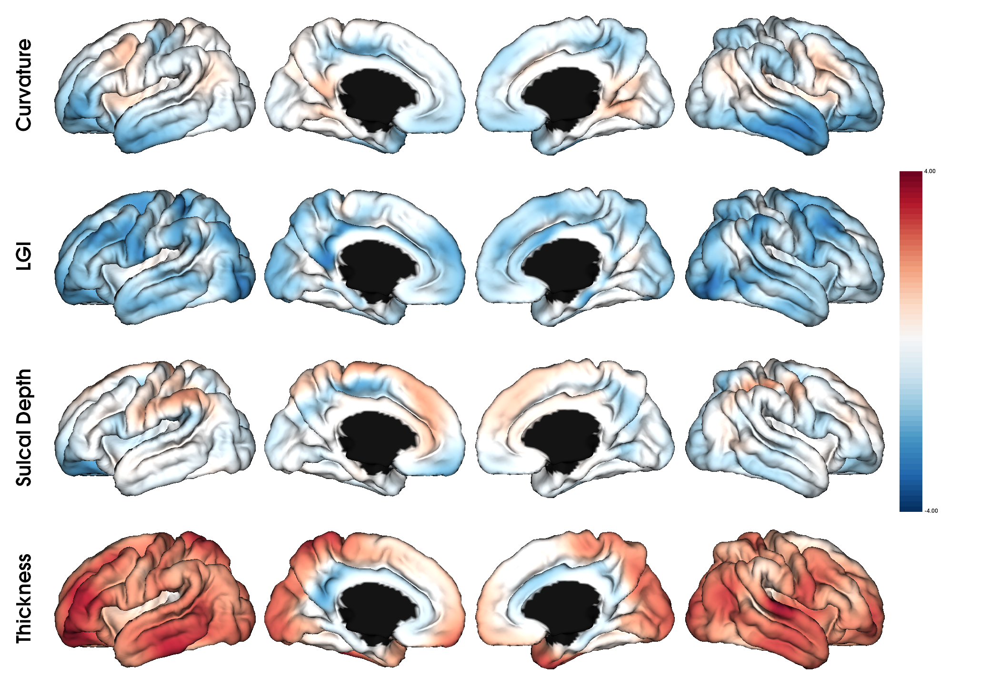

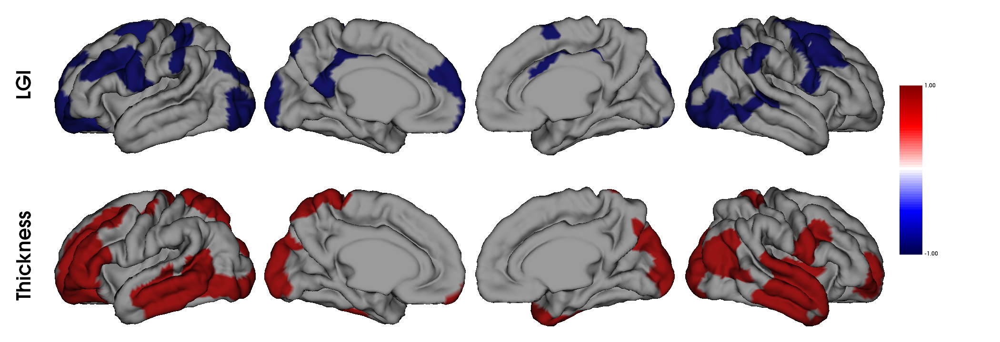

In [16]:
for k in ['lh', 'rh']:
    joint_k = f'neo_{k}'
    
    s = surf[f'neo_{k}']        
    mask = s.PointData['mask_update'] == 0
    labels = s.PointData['labels_plot']
    
    if k == 'lh':
        tval_curv = slm_mixed_curv.t[0:10242]
        s.append_array(tval_curv, name='tval_curv', at='point')
        tval_lgi = slm_mixed_lgi.t[0:10242]
        s.append_array(tval_lgi, name='tval_lgi', at='point')
        tval_sulc = slm_mixed_sulc.t[0:10242]
        s.append_array(tval_sulc, name='tval_sulc', at='point')
        tval_thickness = slm_mixed_thickness.t[0:10242]
        s.append_array(tval_thickness, name='tval_thickness', at='point')
    else:
        tval_curv = slm_mixed_curv.t[10242:]
        s.append_array(tval_curv, name='tval_curv', at='point')
        tval_lgi = slm_mixed_lgi.t[10242:]
        s.append_array(tval_lgi, name='tval_lgi', at='point')
        tval_sulc = slm_mixed_sulc.t[10242:]
        s.append_array(tval_sulc, name='tval_sulc', at='point')
        tval_thickness = slm_mixed_thickness.t[10242:]
        s.append_array(tval_thickness, name='tval_thickness', at='point')
    
    # Curvature
    clusters1_curv = (tval_curv[mask] > 1.7).astype(float)
    clusters2_curv = -(tval_curv[mask] < -2).astype(float)
    clusters_curv = clusters2_curv + clusters1_curv
    clusters_curv = map_to_mask(clusters_curv, mask, fill=np.nan)
    s.append_array(clusters_curv, name='clusters_curv', at='point')
    clusters_cc_curv = mop.get_connected_components(s, labeling='clusters_curv') # Get connected components
    mask_clusters_to_remove = np.unique(clusters_cc_curv, return_counts=True)[1] <= 50 # All those clusters with 50 or less vertices (50 here is too much and only used for this example)
    clusters_up_curv = clusters_curv.copy()
    clusters_up_curv[np.isin(clusters_cc_curv, np.where(mask_clusters_to_remove)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    clusters_up_curv[mask==0] = np.nan
    
    # LGI
    clusters1_lgi = (tval_lgi[mask] > 2.5).astype(float)
    clusters2_lgi = -(tval_lgi[mask] < -1.9).astype(float)
    clusters_lgi = clusters1_lgi + clusters2_lgi
    clusters_lgi = map_to_mask(clusters_lgi, mask, fill=np.nan)
    s.append_array(clusters_lgi, name='clusters_lgi', at='point')
    clusters_cc_lgi = mop.get_connected_components(s, labeling='clusters_lgi') # Get connected components
    mask_clusters_to_remove1 = np.zeros(np.max(clusters_cc_lgi)) == 1
    for i in range(np.max(clusters_cc_lgi)):
        mask_clusters_to_remove1[i] = np.max(abs(tval_lgi[clusters_cc_lgi==i+1])) > 2.2
    mask_clusters_to_remove = np.unique(clusters_cc_lgi, return_counts=True)[1] <= 50 # All those clusters with 50 or less vertices (50 here is too much and only used for this example)
    clusters_up_lgi = clusters_lgi.copy()
    clusters_up_lgi[np.isin(clusters_cc_lgi, np.where(mask_clusters_to_remove)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    clusters_up_lgi[np.isin(clusters_cc_lgi, np.where(~mask_clusters_to_remove1)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    clusters_up_lgi[clusters_up_lgi==0] = np.nan
    
    # Sulcal Depth
    clusters1_sulc = (tval_sulc[mask] > 1.5).astype(float)
    clusters2_sulc = -(tval_sulc[mask] < -1.5).astype(float)
    clusters_sulc = clusters1_sulc + clusters2_sulc
    clusters_sulc = map_to_mask(clusters_sulc, mask, fill=np.nan)
    s.append_array(clusters_sulc, name='clusters_sulc', at='point')
    clusters_cc_sulc = mop.get_connected_components(s, labeling='clusters_sulc') # Get connected components
    mask_clusters_to_remove = np.unique(clusters_cc_sulc, return_counts=True)[1] <= 50 # All those clusters with 50 or less vertices (50 here is too much and only used for this example)
    clusters_up_sulc = clusters_sulc.copy()
    clusters_up_sulc[np.isin(clusters_cc_sulc, np.where(mask_clusters_to_remove)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    clusters_up_sulc[mask==0] = np.nan
    
    # Thickness
    clusters1_thickness = (tval_thickness[mask] > 2.2).astype(float)
    clusters2_thickness = -(tval_thickness[mask] < -2.2).astype(float)
    clusters_thickness = clusters1_thickness + clusters2_thickness
    clusters_thickness = map_to_mask(clusters_thickness, mask, fill=np.nan)
    s.append_array(clusters_thickness, name='clusters_thickness', at='point')
    clusters_cc_thickness = mop.get_connected_components(s, labeling='clusters_thickness') # Get connected components
    mask_clusters_to_remove1 = np.zeros(np.max(clusters_cc_thickness)) == 1
    for i in range(np.max(clusters_cc_thickness)):
        mask_clusters_to_remove1[i] = np.max(abs(tval_thickness[clusters_cc_thickness==i+1])) > 2.5
    mask_clusters_to_remove = np.unique(clusters_cc_thickness, return_counts=True)[1] <= 50 # All those clusters with 50 or less vertices (50 here is too much and only used for this example)
    clusters_up_thickness = clusters_thickness.copy()
    clusters_up_thickness[np.isin(clusters_cc_thickness, np.where(mask_clusters_to_remove)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    clusters_up_thickness[np.isin(clusters_cc_thickness, np.where(~mask_clusters_to_remove1)[0]+1)] = 0 # Set to zero (or any other value that denotes removed)
    clusters_up_thickness[clusters_up_thickness==0] = np.nan
    
    s.append_array(clusters_up_curv, name='clusters_curv', at='point')
    s.append_array(clusters_up_lgi, name='clusters_lgi', at='point')
    s.append_array(clusters_up_sulc, name='clusters_sulc', at='point')
    s.append_array(clusters_up_thickness, name='clusters_thickness', at='point')
    
p = splot.plot_hemispheres(surf[f'neo_lh'], surf[f'neo_rh'], 
                   interactive=False, embed_nb=True, scale=3, zoom=1.5, 
                   size=(700, 4*120), 
                   array_name=['tval_curv', 'tval_lgi', 'tval_sulc', 'tval_thickness'],
                   cmap='RdBu_r',
                   mapper__interpolateScalarsBeforeMapping=False,
                   nan_color = (0, 0, 0, 1),
                   label_text=['Curvature', 'LGI', 'Sulcal Depth', 'Thickness'],
                   color_bar=True, share=True, color_range = (-4, 4)
                  )

display(p)
print('\n\n\n')

p = splot.plot_hemispheres(surf[f'neo_lh'], surf[f'neo_rh'], 
                       interactive=False, embed_nb=True, scale=3, zoom=1.5, 
                       size=(700, 2*120), 
                       array_name=['clusters_lgi', 'clusters_thickness'],
                       cmap='seismic',
                       mapper__interpolateScalarsBeforeMapping=False,
                       nan_color = (0.5, 0.5, 0.5, 1),
                       label_text=['LGI', 'Thickness'],
                       color_bar=True, share=True, color_range = (-1, 1)
                      )

display(p)
print('\n\n\n')

/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/ipykernel_launcher.py:96: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/ipykernel_launcher.py:97: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/ipykernel_launcher.py:98: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/ipykernel_launcher.py:99: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/ipykernel_launcher.py:113: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/Users/andrea/Desktop/analysis/vpython3.7/lib/python3.7/site-packages/ipykernel_launcher.py:114: UserWarning: Boolean Series key will be re

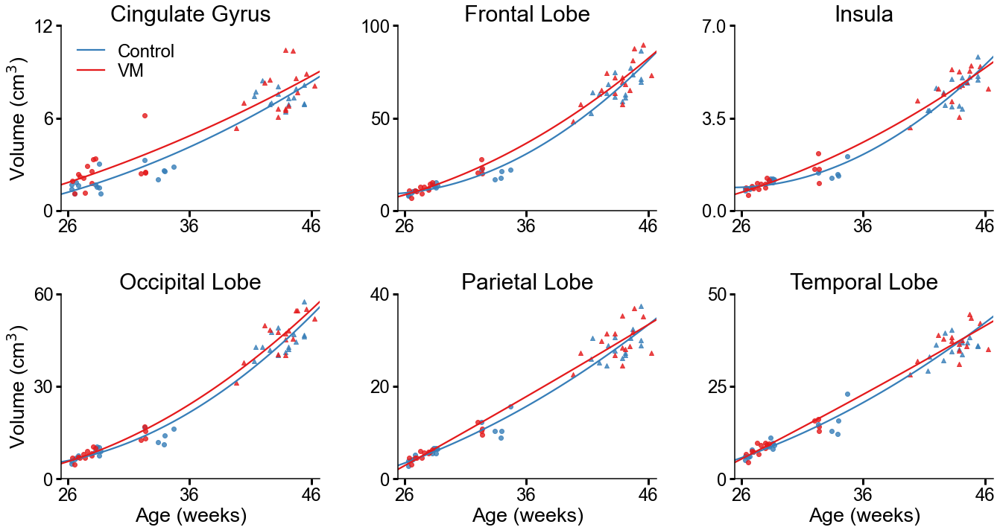

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
from statannot import add_stat_annotation

import itertools
from collections import defaultdict

from scipy.io import loadmat

from brainspace.vtk_interface import wrap_vtk, serial_connect
from nibabel.freesurfer import read_morph_data
import vtk

from brainspace.plotting import surface_plotting as splot
from brainspace.mesh import mesh_operations as mop, mesh_io as mio, array_operations as aop
from brainspace.utils.parcellation import map_to_mask, map_to_labels

def set_ticks_lim(ax, kind='y', precision=2, pad=5, n_ticks=3):
    low, upp = ax.get_ylim() if kind == 'y' else ax.get_xlim()
    exp = 10 ** precision
    pad = pad * 10 ** (-precision - 1)
    clow = np.ceil(np.abs(low) * exp)
    cupp = np.ceil(np.abs(upp) * exp)

    if (cupp - clow) % 2 != 0:
        d1 = np.abs(low - (clow - 1) / exp)
        d2 = np.abs(upp - (cupp + 1) / exp)
        if d1 <= d2:
            clow -= 1
        else:
            cupp += 1

    clow = np.sign(low) * clow / exp
    cupp = np.sign(upp) * cupp / exp
    if kind == 'y':
        ax.set_ylim(clow - pad, cupp + pad)
        ax.set_yticks(np.linspace(clow, cupp, n_ticks))
    else:
        ax.set_xlim(clow - pad, cupp + pad)
        ax.set_xticks(np.linspace(clow, cupp, n_ticks))



colors = sns.color_palette("Set1", 2)[::-1]
color_cn, color_vm = colors

timepoints = ['Fetal', 'Neonatal']

p1 = {'font.family': 'Arial', 'font.serif': 'Arial', 'text.usetex': False,
      'xtick.labelsize': 24, 'ytick.labelsize': 24,
      'axes.labelsize': 27, 'axes.linewidth': 1.5,
      'axes.titlesize': 30,
      'xtick.direction': 'out', 'ytick.direction': 'out',
#       'xtick.major.size': 3,
      'xtick.major.size': 7.5,
#            'ytick.major.size': 1.5,
           'ytick.major.size': 7.5,
#       'xtick.major.width': 1.25,
      'xtick.major.width': 3,
#       'ytick.major.width': 1.25,
      'ytick.major.width': 3,
      'legend.fontsize': 24, 'legend.handletextpad': 0.75,
      'legend.labelspacing': 0.15, 'legend.handlelength': 1.5}

df['CingulateVolume'] = df[['CingulateL',
       'CingulateR']].sum(1)
df['FrontalVolume'] = df[['FrontalL', 'FrontalR']].sum(1)
df['InsulaVolume'] = df[['InsulaL', 'InsulaR']].sum(1)
df['OccipitalVolume'] = df[['OccipitalL', 'OccipitalR']].sum(1)
df['ParietalVolume'] = df[['ParietalL', 'ParietalR']].sum(1)
df['TemporalVolume'] = df[['TempLobeL', 'TempLobeR']].sum(1)


with plt.rc_context(p1):
    fig = plt.figure(tight_layout=False, figsize=(24, 10))
    gs = gridspec.GridSpec(2, 4)

    ax_cingulate = fig.add_subplot(gs[0, 1])
    ax_frontal = fig.add_subplot(gs[0, 2])
    ax_insula = fig.add_subplot(gs[0, 3])
    ax_occipital = fig.add_subplot(gs[1, 1])
    ax_parietal = fig.add_subplot(gs[1, 2])
    ax_temporal = fig.add_subplot(gs[1, 3])
    plt.subplots_adjust(hspace = 0.3)
    #axs = [fig.add_subplot(gs[1, i]) for i in range(4)] # Curvature, LGI, Sulcal depth and Thickness


    df_cn = df[df.Diagnosis != 'VM']
    df_vm = df[df.Diagnosis == 'VM']

    ax = ax_cingulate
    sns.regplot(x='Age', y='CingulateVolume', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    sns.regplot(x='Age', y='CingulateVolume', data=df_cn, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=2)
    sns.regplot(x='Age', y='CingulateVolume', data=df_vm, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_vm, order=2)
    sns.regplot(x='Age', y='CingulateVolume', data=df_cn[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='CingulateVolume', data=df_cn[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="^", fit_reg=False)
    sns.regplot(x='Age', y='CingulateVolume', data=df_vm[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='CingulateVolume', data=df_vm[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="^", fit_reg=False)
    ax.set_ylabel('Volume (cm$^3$)')
    ax.set_ylim(0, 12)
    ax.set_yticks([0, 6, 12])
    ax.set_xlabel('')
    ax.set_xlim([25.5, 46.7])
    ax.set_xticks([26, 36, 46])
    ax.set_title('Cingulate Gyrus')
    ax.legend([None, 'Control', 'VM'], frameon=False, loc='upper left', bbox_to_anchor=(0, 1.1))
    
    ax = ax_frontal
    sns.regplot(x='Age', y='FrontalVolume', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    sns.regplot(x='Age', y='FrontalVolume', data=df_cn, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=2)
    sns.regplot(x='Age', y='FrontalVolume', data=df_vm, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_vm, order=2)
    sns.regplot(x='Age', y='FrontalVolume', data=df_cn[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='FrontalVolume', data=df_cn[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="^", fit_reg=False)
    sns.regplot(x='Age', y='FrontalVolume', data=df_vm[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='FrontalVolume', data=df_vm[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="^", fit_reg=False)
    ax.set_ylabel('')
    ax.set_ylim(0, 100)
    ax.set_yticks([0, 50, 100])
    ax.set_xlabel('')
    ax.set_xlim([25.5, 46.7])
    ax.set_xticks([26, 36, 46])
    ax.set_title('Frontal Lobe')
    
    ax = ax_insula
    sns.regplot(x='Age', y='InsulaVolume', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    sns.regplot(x='Age', y='InsulaVolume', data=df_cn, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=2)
    sns.regplot(x='Age', y='InsulaVolume', data=df_vm, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_vm, order=2)
    sns.regplot(x='Age', y='InsulaVolume', data=df_cn[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='InsulaVolume', data=df_cn[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="^", fit_reg=False)
    sns.regplot(x='Age', y='InsulaVolume', data=df_vm[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='InsulaVolume', data=df_vm[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="^", fit_reg=False)
    ax.set_ylabel('')
    ax.set_ylim(0, 7)
    ax.set_yticks([0, 3.5, 7])
    ax.set_xlabel('')
    ax.set_xlim([25.5, 46.7])
    ax.set_xticks([26, 36, 46])
    ax.set_title('Insula')
    
    ax = ax_occipital
    sns.regplot(x='Age', y='OccipitalVolume', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    sns.regplot(x='Age', y='OccipitalVolume', data=df_cn, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=2)
    sns.regplot(x='Age', y='OccipitalVolume', data=df_vm, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_vm, order=2)
    sns.regplot(x='Age', y='OccipitalVolume', data=df_cn[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='OccipitalVolume', data=df_cn[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="^", fit_reg=False)
    sns.regplot(x='Age', y='OccipitalVolume', data=df_vm[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='OccipitalVolume', data=df_vm[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="^", fit_reg=False)
    ax.set_ylabel('Volume (cm$^3$)')
    ax.set_ylim(0, 60)
    ax.set_yticks([0, 30, 60])
    ax.set_xlabel('Age (weeks)')
    ax.set_xlim([25.5, 46.7])
    ax.set_xticks([26, 36, 46])
    ax.set_title('Occipital Lobe')
    
    ax = ax_parietal
    sns.regplot(x='Age', y='ParietalVolume', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    sns.regplot(x='Age', y='ParietalVolume', data=df_cn, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=2)
    sns.regplot(x='Age', y='ParietalVolume', data=df_vm, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_vm, order=2)
    sns.regplot(x='Age', y='ParietalVolume', data=df_cn[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='ParietalVolume', data=df_cn[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="^", fit_reg=False)
    sns.regplot(x='Age', y='ParietalVolume', data=df_vm[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='ParietalVolume', data=df_vm[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="^", fit_reg=False)
    ax.set_ylabel('')
    ax.set_ylim(0, 40)
    ax.set_yticks([0, 20, 40])
    ax.set_xlabel('Age (weeks)')
    ax.set_xlim([25.5, 46.7])
    ax.set_xticks([26, 36, 46])
    ax.set_title('Parietal Lobe')
    
    ax = ax_temporal
    sns.regplot(x='Age', y='TemporalVolume', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    sns.regplot(x='Age', y='TemporalVolume', data=df_cn, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=2)
    sns.regplot(x='Age', y='TemporalVolume', data=df_vm, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_vm, order=2)
    sns.regplot(x='Age', y='TemporalVolume', data=df_cn[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='TemporalVolume', data=df_cn[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_cn, marker="^", fit_reg=False)
    sns.regplot(x='Age', y='TemporalVolume', data=df_vm[df.Group == 'Fetal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="o", fit_reg=False)
    sns.regplot(x='Age', y='TemporalVolume', data=df_vm[df.Group == 'Neonatal'], ax=ax, truncate = False, ci=0, color=color_vm, marker="^", fit_reg=False)
    ax.set_ylabel('')
    ax.set_ylim(0, 50)
    ax.set_yticks([0, 25, 50])
    ax.set_xlabel('Age (weeks)')
    ax.set_xlim([25.5, 46.7])
    ax.set_xticks([26, 36, 46])
    ax.set_title('Temporal Lobe')
    
    for ax in ([ax_cingulate, ax_frontal, ax_insula, ax_occipital, ax_parietal, ax_temporal]):
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
    fig.tight_layout(h_pad=5, w_pad=3)

In [18]:
import numpy as np
from brainspace.datasets import load_gradient, load_marker, load_conte69

lh = mio.read_surface('/Users/andrea/Desktop/analysis/neo/lh.avg_pial', itype='fs') # /path/to/left/hemisphere
rh = mio.read_surface('/Users/andrea/Desktop/analysis/neo/rh.avg_pial', itype='fs') # /path/to/right/hemisphere
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
surf_lh = serial_connect(lh, normalsFilter)
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
surf_rh = serial_connect(rh, normalsFilter)

lh = mio.read_surface('/Users/andrea/Desktop/analysis/neo/lh.sphere.vtk', itype='vtk') # /path/to/left/hemisphere
rh = mio.read_surface('/Users/andrea/Desktop/analysis/neo/rh.sphere.vtk', itype='vtk') # /path/to/right/hemisphere
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
sphere_lh = serial_connect(lh, normalsFilter)
normalsFilter = wrap_vtk(vtkPolyDataNormals, splitting=False, consistency=True, autoOrientNormals=True, computePointNormals=True, 
                         computeCellNormals=True, nonManifoldTraversal=True)
sphere_rh = serial_connect(rh, normalsFilter)

from brainspace.null_models import SpinPermutations
from brainspace.plotting import plot_hemispheres

tval_curv_lh = slm_mixed_curv.t[0:10242]
s.append_array(tval_curv_lh, name='tval_curv', at='point')
tval_lgi_lh = slm_mixed_lgi.t[0:10242]
s.append_array(tval_lgi_lh, name='tval_lgi', at='point')
tval_sulc_lh = slm_mixed_sulc.t[0:10242]
s.append_array(tval_sulc_lh, name='tval_sulc', at='point')
tval_thickness_lh = slm_mixed_thickness.t[0:10242]
s.append_array(tval_thickness_lh, name='tval_thickness', at='point')

tval_curv_rh = slm_mixed_curv.t[10242:]
s.append_array(tval_curv_rh, name='tval_curv', at='point')
tval_lgi_rh = slm_mixed_lgi.t[10242:]
s.append_array(tval_lgi_rh, name='tval_lgi', at='point')
tval_sulc_rh = slm_mixed_sulc.t[10242:]
s.append_array(tval_sulc_rh, name='tval_sulc', at='point')
tval_thickness_rh = slm_mixed_thickness.t[10242:]
s.append_array(tval_thickness_rh, name='tval_thickness', at='point')

sphere_lh

<BSPolyData object at 0x1b50d21d0 [Wrapping a vtkmodules.vtkCommonDataModel.vtkPolyData(0x7fbee2dad430]>

In [19]:
# Let's create some rotations
n_rand = 1000

sp = SpinPermutations(n_rep=n_rand, random_state=0)
sp.fit(sphere_lh, points_rh=sphere_rh)

curv_rotated = np.hstack(sp.randomize(tval_curv_lh, tval_curv_rh))
sulc_rotated = np.hstack(sp.randomize(tval_sulc_lh, tval_sulc_rh))
thick_rotated = np.hstack(sp.randomize(tval_thickness_lh, tval_thickness_rh))

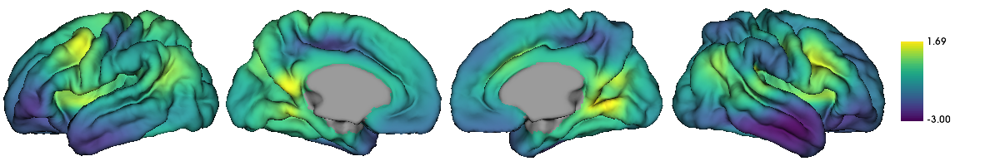

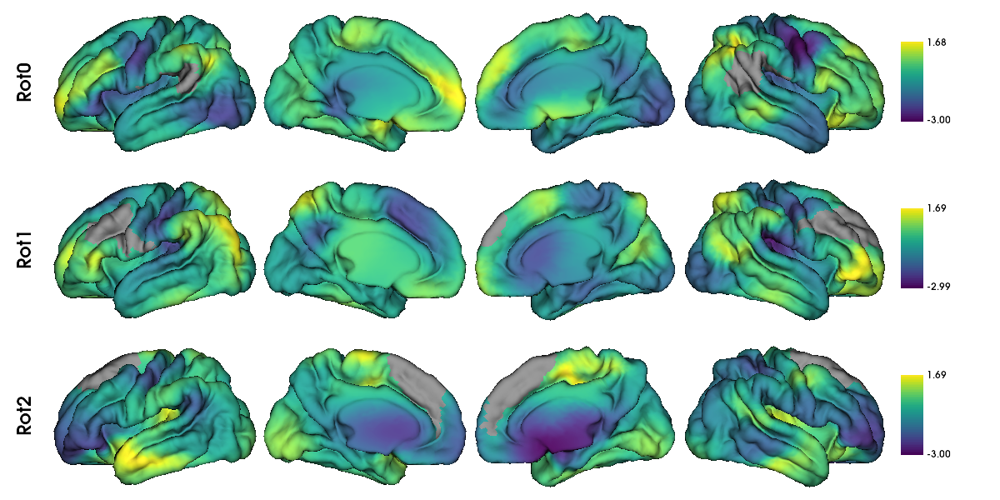

0 Curvature [-1.73365719  0.08045913 -2.12948248 ... -2.60140065 -2.51760279
 -2.37116548]
Curvature:
 Obs : 0.08466414169990719
 Spin: 4.00000e-02

1 Sulcal Depth [ 0.83832153  0.3757218  -1.54105806 ... -0.94383654 -1.04188825
 -1.16921871]
Sulcal depth:
 Obs : 0.0759775485808196
 Spin: 6.67000e-01

2 Thickness [-1.84646316 -2.73616562 -0.59776853 ... -2.39709679 -2.46678188
 -2.55113424]
Thickness:
 Obs : 0.09429698843675921
 Spin: 4.00000e-03



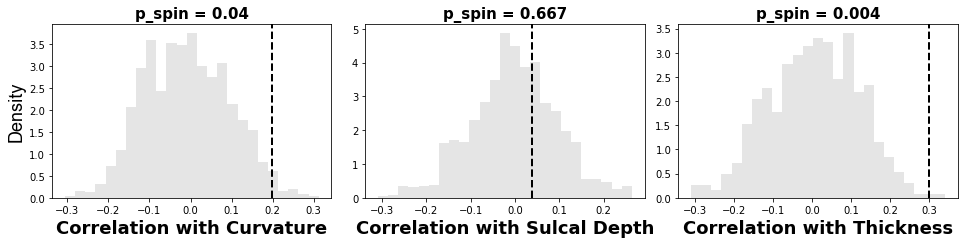

In [20]:
# Plot original data
p = splot.plot_hemispheres(surf_lh, surf_rh, interactive=False, embed_nb=True, array_name=slm_mixed_curv.t, size=(1200, 200), cmap='viridis',
                 nan_color=(0.5, 0.5, 0.5, 1), color_bar=True, zoom=1.65)

display(p)

# Plot some rotations
p = splot.plot_hemispheres(surf_lh, surf_rh, interactive=False, embed_nb=True, array_name=curv_rotated[:3,], size=(1200, 600),
                 cmap='viridis', nan_color=(0.5, 0.5, 0.5, 1), color_bar=True,
                 zoom=1.55, label_text=['Rot0', 'Rot1', 'Rot2'])
display(p)

from matplotlib import pyplot as plt
from scipy.stats import spearmanr, pearsonr

fig, axs = plt.subplots(1, 3, figsize=(13.5, 3.5))

feats = {'Curvature': slm_mixed_curv.t, 'Sulcal Depth': slm_mixed_sulc.t, 'Thickness': -slm_mixed_thickness.t}
rotated = {'Curvature': curv_rotated, 'Sulcal Depth': sulc_rotated, 'Thickness': thick_rotated}

r_spin = np.empty(n_rand)
mask = ~np.isnan(slm_mixed_curv.t)
for k, (fn, feat) in enumerate(feats.items()):
    print(k,fn,feat)
    r_obs, pv_obs = spearmanr(feat[mask], slm_mixed_lgi.t[mask])

    # Compute perm pval
    for i, perm in enumerate(rotated[fn]):
        mask_rot = mask & ~np.isnan(perm)  # Remove midline
        r_spin[i] = spearmanr(perm[mask_rot], slm_mixed_lgi.t[mask_rot])[0]
    pv_spin = np.mean(np.abs(r_spin) >= np.abs(r_obs))

    # Plot null dist
    axs[k].hist(r_spin, bins=25, density=True, alpha=0.5, color=(.8, .8, .8))
    axs[k].axvline(r_obs, lw=2, ls='--', color='k')
    axs[k].set_xlabel(f'Correlation with {fn}', fontsize=18, weight='bold')
    axs[k].set_title(f'p_spin = {pv_spin:.3}', fontsize=15, weight='bold')
    if k == 0:
        axs[k].set_ylabel('Density', fontsize=18, family='Arial')

    print(f'{fn.capitalize()}:\n Obs : {np.mean(np.abs(r_spin))}\n Spin: {pv_spin:.5e}\n')

fig.tight_layout()
plt.show()

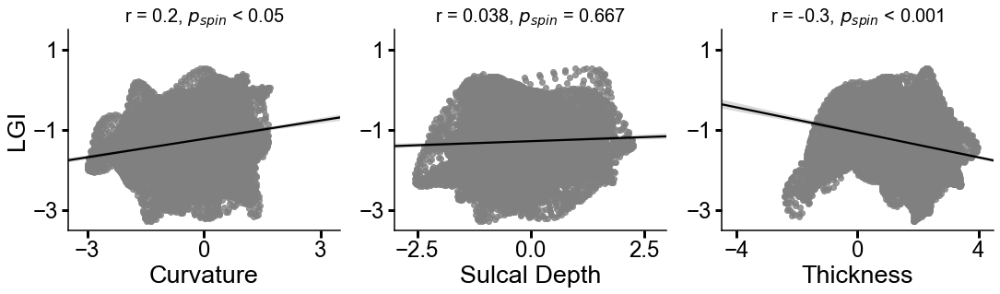

In [28]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.gridspec as gridspec
from statannot import add_stat_annotation

import itertools
from collections import defaultdict

from scipy.io import loadmat

from brainspace.vtk_interface import wrap_vtk, serial_connect
from nibabel.freesurfer import read_morph_data
import vtk

from brainspace.plotting import surface_plotting as splot
from brainspace.mesh import mesh_operations as mop, mesh_io as mio, array_operations as aop
from brainspace.utils.parcellation import map_to_mask, map_to_labels

def set_ticks_lim(ax, kind='y', precision=2, pad=5, n_ticks=3):
    low, upp = ax.get_ylim() if kind == 'y' else ax.get_xlim()
    exp = 10 ** precision
    pad = pad * 10 ** (-precision - 1)
    clow = np.ceil(np.abs(low) * exp)
    cupp = np.ceil(np.abs(upp) * exp)

    if (cupp - clow) % 2 != 0:
        d1 = np.abs(low - (clow - 1) / exp)
        d2 = np.abs(upp - (cupp + 1) / exp)
        if d1 <= d2:
            clow -= 1
        else:
            cupp += 1

    clow = np.sign(low) * clow / exp
    cupp = np.sign(upp) * cupp / exp
    if kind == 'y':
        ax.set_ylim(clow - pad, cupp + pad)
        ax.set_yticks(np.linspace(clow, cupp, n_ticks))
    else:
        ax.set_xlim(clow - pad, cupp + pad)
        ax.set_xticks(np.linspace(clow, cupp, n_ticks))

df = {'Curvature': slm_mixed_curv.t, 'LGI': slm_mixed_lgi.t, 'Sulcal Depth': slm_mixed_sulc.t, 'Thickness': slm_mixed_thickness.t}

colors = sns.color_palette("Set1", 2)[::-1]
color_cn, color_vm = colors

timepoints = ['Fetal', 'Neonatal']

p1 = {'font.family': 'Arial', 'font.serif': 'Arial', 'text.usetex': False,
      'xtick.labelsize': 24, 'ytick.labelsize': 24,
      'axes.labelsize': 27, 'axes.linewidth': 1.5,
      'axes.titlesize': 30,
      'xtick.direction': 'out', 'ytick.direction': 'out',
#       'xtick.major.size': 3,
      'xtick.major.size': 7.5,
#            'ytick.major.size': 1.5,
           'ytick.major.size': 7.5,
#       'xtick.major.width': 1.25,
      'xtick.major.width': 3,
#       'ytick.major.width': 1.25,
      'ytick.major.width': 3,
      'legend.fontsize': 24, 'legend.handletextpad': 0.75,
      'legend.labelspacing': 0.15, 'legend.handlelength': 1.5}

with plt.rc_context(p1):
    fig = plt.figure(tight_layout=False, figsize=(18, 4))
    gs = gridspec.GridSpec(1, 3)

    ax1 = fig.add_subplot(gs[0, 0])
    ax2 = fig.add_subplot(gs[0, 1])
    ax3 = fig.add_subplot(gs[0, 2])
    plt.subplots_adjust(hspace = 0.3)
    
    ax = ax1
    ax.set_ylabel('')
    ax.set_ylim(-3.5, 1.5)
    ax.set_yticks([-3, -1, 1])
    ax.set_xlabel('Curvature')
    ax.set_xlim([-3.5, 3.5])
    ax.set_xticks([-3, 0, 3])
    ax.set_ylabel('LGI')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    r_obs, pv_obs = spearmanr(df['Curvature'][mask], df['LGI'][mask])
    ax.set_title(f'r = {r_obs:.2},' + ' $p_{spin}$ < 0.05', fontsize=20)
    #sns.regplot(x='Curvature', y='LGI', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    #sns.regplot(x='Curvature', y='LGI', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=1)
    sns.regplot(x='Curvature', y='LGI', data=df, ax=ax, truncate = False, ci=100, color='grey', fit_reg=True, line_kws={'color': 'black'})
    
    #ax.legend([None, 'Control', 'VM'], frameon=False, loc='upper left', bbox_to_anchor=(0, 1.1))
    
    ax = ax2
    ax.set_ylabel('')
    ax.set_ylim(-3.5, 1.5)
    ax.set_yticks([-3, -1, 1])
    ax.set_xlabel('Sulcal Depth')
    ax.set_xlim([-3.0, 3.0])
    ax.set_xticks([-2.5, 0, 2.5])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    r_obs, pv_obs = spearmanr(df['Sulcal Depth'][mask], df['LGI'][mask])
    ax.set_title(f'r = {r_obs:.2},' + ' $p_{spin}$ = 0.667', fontsize=20)
    #sns.regplot(x='Sulcal Depth', y='LGI', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, line_kws={'lw': 0})
    #sns.regplot(x='Sulcal Depth', y='LGI', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color=color_cn, order=1)
    sns.regplot(x='Sulcal Depth', y='LGI', data=df, ax=ax, truncate = False, ci=100, color='grey', fit_reg=True, line_kws={'color': 'black'})
    
    #ax.legend([None, 'Control', 'VM'], frameon=False, loc='upper left', bbox_to_anchor=(0, 1.1))

    ax = ax3
    ax.set_ylabel('')
    ax.set_ylim(-3.5, 1.5)
    ax.set_yticks([-3, -1, 1])
    ax.set_xlabel('Thickness')
    ax.set_xlim([-4.5, 4.5])
    ax.set_xticks([-4, 0, 4])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    r_obs, pv_obs = spearmanr(df['Thickness'][mask], df['LGI'][mask])
    ax.set_title(f'r = {r_obs:.2},' + ' $p_{spin}$ < 0.001', fontsize=20)
    #sns.regplot(x='Thickness', y='LGI', data=df, ax=ax, truncate = False, ci=0, line_kws={'lw': 0})
    #sns.regplot(x='Thickness', y='LGI', data=df, ax=ax, truncate = False, ci=0, scatter_kws={'s': 0}, color='black', order=1)
    sns.regplot(x='Thickness', y='LGI', data=df, ax=ax, truncate = False, ci=100, color='grey', fit_reg=True, line_kws={'color': 'black'})
    #ax.legend([None, 'Control', 'VM'], frameon=False, loc='upper left', bbox_to_anchor=(0, 1.1))
    


In [ ]:
pearsonr(df['LGI'][mask], df['Curvature'][mask])[0]

In [ ]:
feats = {'Curvature': slm_mixed_curv.t, 'Sulcal Depth': slm_mixed_sulc.t, 'Thickness': -slm_mixed_thickness.t}

r_spin = np.empty(n_rand)
mask = ~np.isnan(slm_mixed_curv.t)
for k, (fn, feat) in enumerate(feats.items()):
    
    print(r_obs)